In [10]:
import scanpy as sc
import scarches as sca
import numpy as np
from scarches.plotting.terms_scores import plot_abs_bfs_key

In [11]:
sc.set_figure_params(figsize=(6, 6))
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sb

font = {'family' : 'Arial',
        'size'   : 14}

matplotlib.rc('font', **font)
matplotlib.rc('ytick', labelsize=14)
matplotlib.rc('xtick', labelsize=14)
matplotlib.rcParams["figure.dpi"] = 140

### Pbmc Kang

In [12]:
adata = sc.read('kang_pbmc_integrated.h5ad')

In [13]:
adata.obs['condition_merged'] = adata.obs['condition'].tolist()
adata.obs['condition_merged'][adata.obs['condition_merged'].astype(str)=='nan'] = 'control'
adata.strings_to_categoricals()

<ipython-input-13-dcc145970c64>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['condition_merged'][adata.obs['condition_merged'].astype(str)=='nan'] = 'control'
... storing 'condition_merged' as categorical


In [14]:
intr_cvae = sca.models.TRVAE.load('q_intr_cvae_nolog_alpha_kl_0_5_0_1_sd_2020', adata)


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 1972 256 5
	Hidden Layer 1 in/out: 256 256
	Hidden Layer 2 in/out: 256 256
	Mean/Var Layer in/out: 256 282
Decoder Architecture:
	Masked linear layer in, out and cond:  282 1972 5


In [15]:
directions = intr_cvae._latent_directions(method="sum")

In [16]:
adata.obsm['X_cvae'] *= directions[intr_cvae.model.decoder.nonzero_terms()]

In [17]:
scores_cond = intr_cvae.latent_enrich('condition_merged', comparison="control", directions=directions, adata=adata, n_perm=7000)

In [18]:
scores_ct = intr_cvae.latent_enrich('cell_type_joint', directions=directions, n_perm=7000, adata=adata)

In [22]:
adata.uns['active_terms'] = adata.uns['full_terms'][intr_cvae.model.decoder.nonzero_terms()]

In [74]:
adata_ct = adata[adata.obs.cell_type_joint == 'CD14+ Monocytes']

In [75]:
scores_c_ct = intr_cvae.latent_enrich('condition_merged', comparison="control", directions=directions, adata=adata_ct, n_perm=10000)

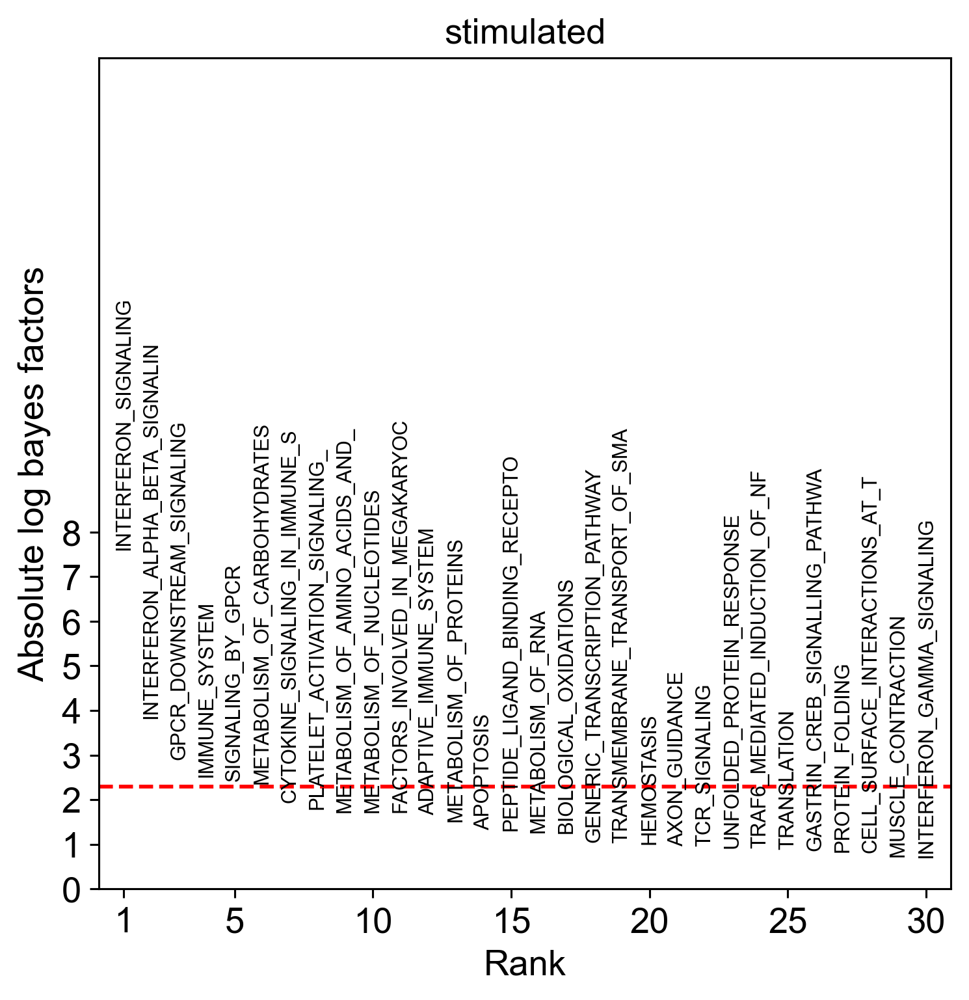

In [76]:
axs = plot_abs_bfs_key(scores_c_ct, adata.uns['terms'], 'stimulated', yt_step=1, scale_y=2.45)

In [77]:
adata_ct.uns['active_terms'] = adata.uns['terms'][intr_cvae.model.decoder.nonzero_terms()]

Trying to set attribute `._uns` of view, copying.


In [78]:
def filter_set_scores(scores, adata, filter_v=2.31):
    for k in scores:
        print(k)
        mask = np.abs(scores[k]['bf']) > filter_v
        s = sum(mask)
        if s > 0:
            sort = np.argsort(np.abs(scores[k]['bf'])[mask])[::-1]
            enriched_terms = adata.uns['terms'][mask][sort]
            
            print(enriched_terms)
            print(scores[k]['bf'][mask][sort])
            
            for term in enriched_terms:
                adata.obs[term] = adata.obsm['X_cvae'][:, adata.uns['active_terms'] == term]

In [79]:
filter_set_scores(scores_c_ct, adata_ct, filter_v=1)

stimulated
['INTERFERON_SIGNALING' 'INTERFERON_ALPHA_BETA_SIGNALIN'
 'GPCR_DOWNSTREAM_SIGNALING' 'IMMUNE_SYSTEM' 'SIGNALING_BY_GPCR'
 'METABOLISM_OF_CARBOHYDRATES' 'CYTOKINE_SIGNALING_IN_IMMUNE_S'
 'PLATELET_ACTIVATION_SIGNALING_' 'METABOLISM_OF_AMINO_ACIDS_AND_'
 'METABOLISM_OF_NUCLEOTIDES' 'FACTORS_INVOLVED_IN_MEGAKARYOC'
 'ADAPTIVE_IMMUNE_SYSTEM' 'METABOLISM_OF_PROTEINS' 'APOPTOSIS'
 'PEPTIDE_LIGAND_BINDING_RECEPTO' 'METABOLISM_OF_RNA'
 'BIOLOGICAL_OXIDATIONS' 'GENERIC_TRANSCRIPTION_PATHWAY'
 'TRANSMEMBRANE_TRANSPORT_OF_SMA' 'HEMOSTASIS']
[ 7.6   3.82  2.91 -2.51  2.43 -2.37 -1.94 -1.79  1.72 -1.72 -1.72 -1.67
 -1.52 -1.33 -1.31  1.28 -1.25 -1.05  1.04 -1.01]


In [27]:
#check_terms = ['SIGNALING_BY_GPCR', 'CLASS_A1_RHODOPSIN_LIKE_RECEPT', 'IMMUNE_SYSTEM',
#               'RNA_POL_I_RNA_POL_III_AND_MITO', 'METABOLISM_OF_CARBOHYDRATES',
#               'CYTOKINE_SIGNALING_IN_IMMUNE_S', 'APOPTOTIC_EXECUTION_PHASE',
#               'METABOLISM_OF_NUCLEOTIDES', 'BIOLOGICAL_OXIDATIONS',
#               'INTERFERON_GAMMA_SIGNALING']

In [80]:
check_terms = ['INTERFERON_SIGNALING', 'INTERFERON_ALPHA_BETA_SIGNALIN',
 'GPCR_DOWNSTREAM_SIGNALING', 'IMMUNE_SYSTEM', 'SIGNALING_BY_GPCR',
 'METABOLISM_OF_CARBOHYDRATES', 'CYTOKINE_SIGNALING_IN_IMMUNE_S',
 'PLATELET_ACTIVATION_SIGNALING_', 'METABOLISM_OF_AMINO_ACIDS_AND_',
 'METABOLISM_OF_NUCLEOTIDES']

In [ ]:
intr_cvae.terms_genes()['IMMUNE_SYSTEM']

In [81]:
idxs = [adata_ct.uns['active_terms'].tolist().index(t) for t in check_terms]

In [82]:
idxs

[193, 192, 129, 223, 88, 205, 229, 240, 75, 109]

In [83]:
adata_pl = sc.AnnData(X=adata.obsm['X_cvae'][:, idxs])

In [84]:
adata_pl.var_names = check_terms

In [85]:
adata_pl.obs['ct_cond'] = 'stub'

In [86]:
for i in range(adata.n_obs):
    adata_pl.obs['ct_cond'][i] = adata.obs['cell_type_joint'][i] + '_' + adata.obs['condition_merged'][i]

... storing 'ct_cond' as categorical


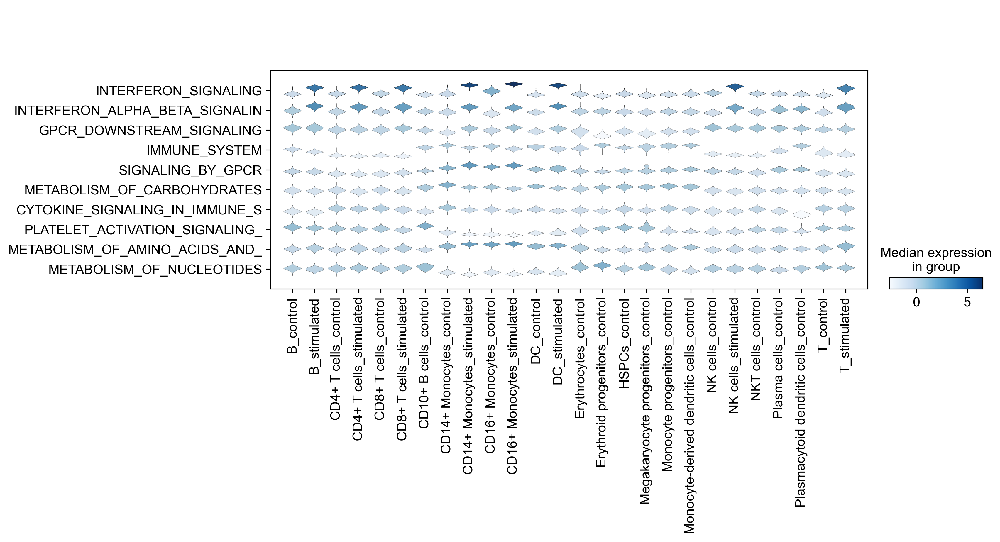

In [87]:
sc.pl.stacked_violin(adata_pl, var_names=check_terms, groupby='ct_cond', swap_axes=True)

In [88]:
query_ct = adata_pl[adata.obs.study == 'Kang'].obs.ct_cond.unique().tolist()

In [89]:
adata_pl_q = adata_pl[adata_pl.obs.ct_cond.isin(query_ct)]

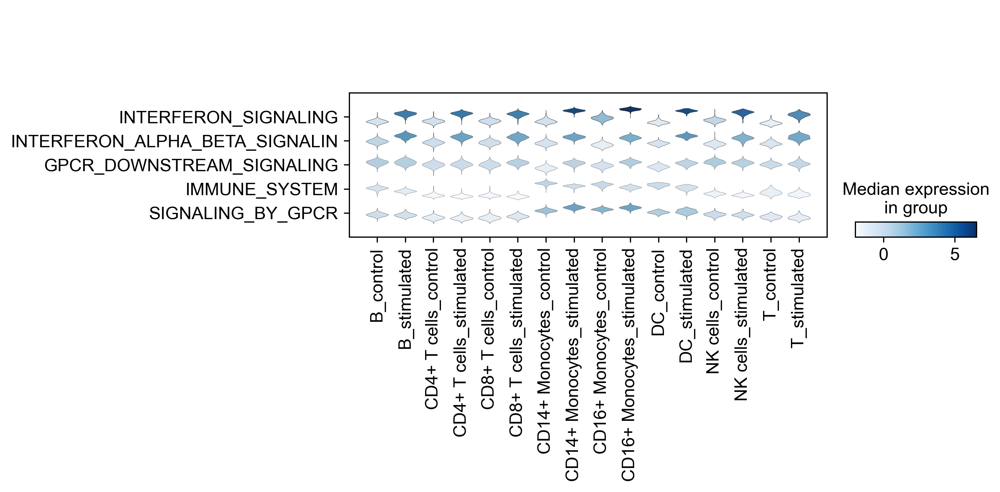

In [100]:
sc.pl.stacked_violin(adata_pl_q, var_names=check_terms[:5], groupby='ct_cond', swap_axes=True)

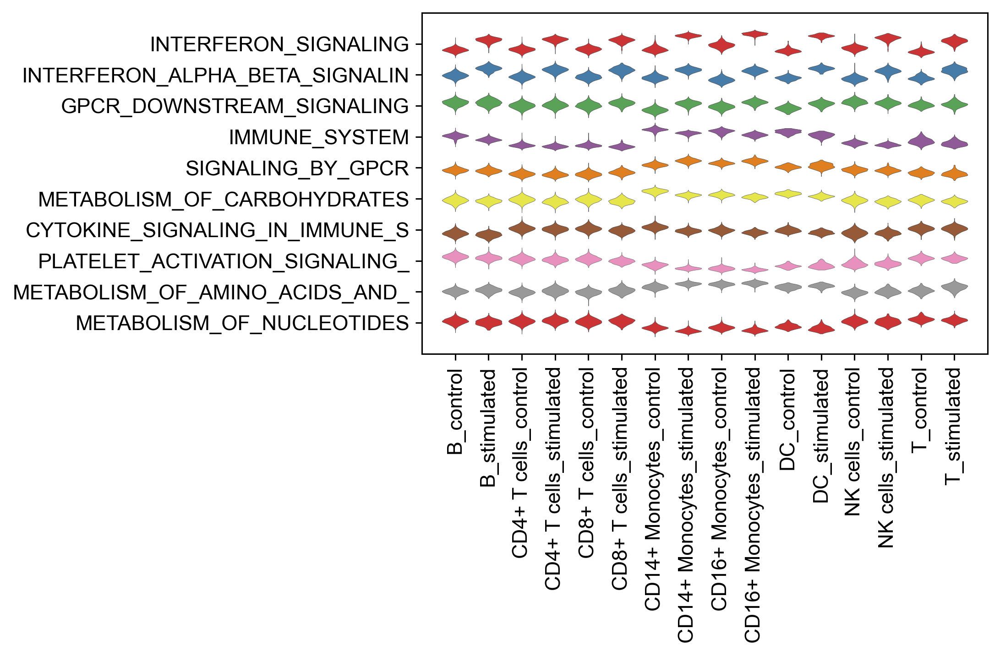

In [97]:
sc.pl.stacked_violin(adata_pl_q, var_names=check_terms, groupby='ct_cond', swap_axes=True, row_palette='Set1')

In [19]:
query_ct = adata.obs.cell_type_joint[adata.obs.batch_join == 'Kang (query)'].unique()

In [20]:
scores_ct_q = {k: v for k, v in scores_ct.items() if k in query_ct}

CD14+ Monocytes


C:\Users\sergei.rybakov\Apps\Miniconda3\envs\work38\lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'ct_cond' as categorical


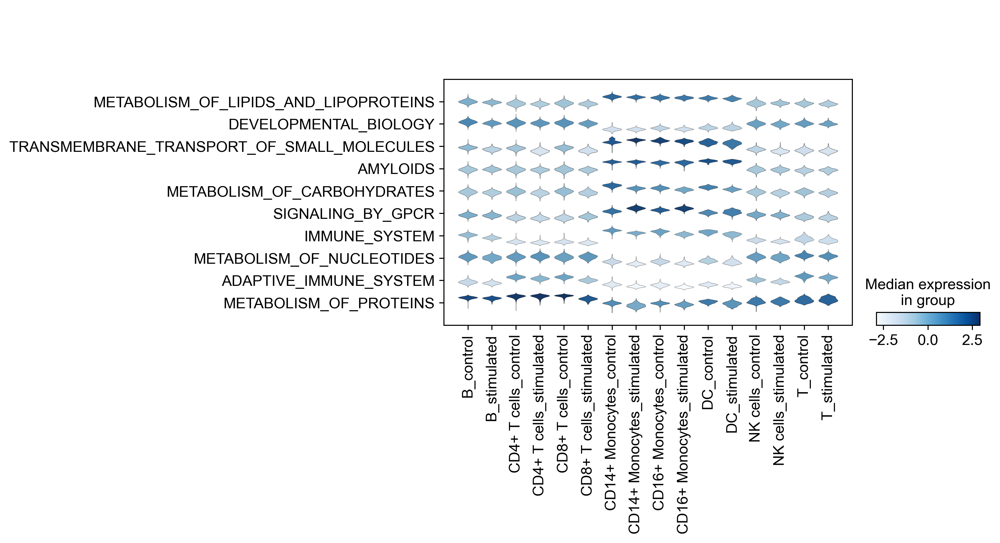

CD4+ T cells


C:\Users\sergei.rybakov\Apps\Miniconda3\envs\work38\lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'ct_cond' as categorical


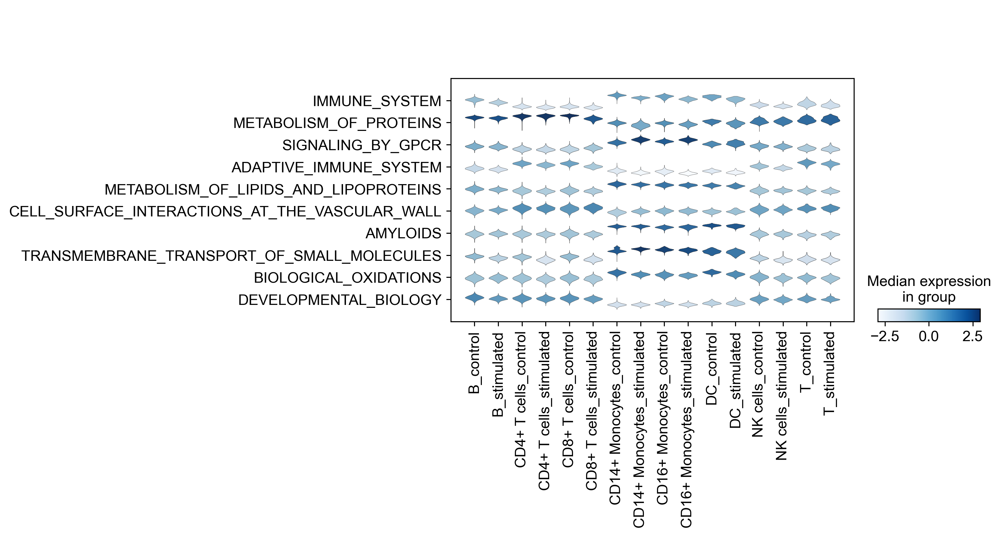

T


C:\Users\sergei.rybakov\Apps\Miniconda3\envs\work38\lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'ct_cond' as categorical


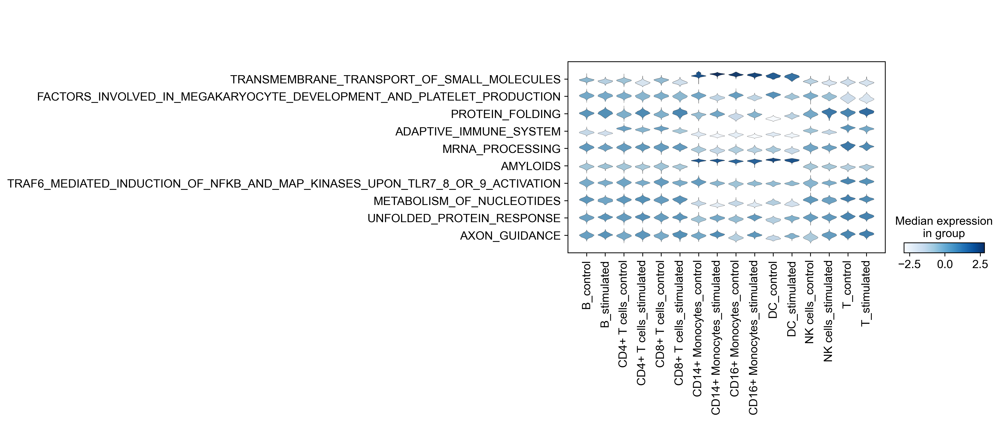

CD8+ T cells


C:\Users\sergei.rybakov\Apps\Miniconda3\envs\work38\lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'ct_cond' as categorical


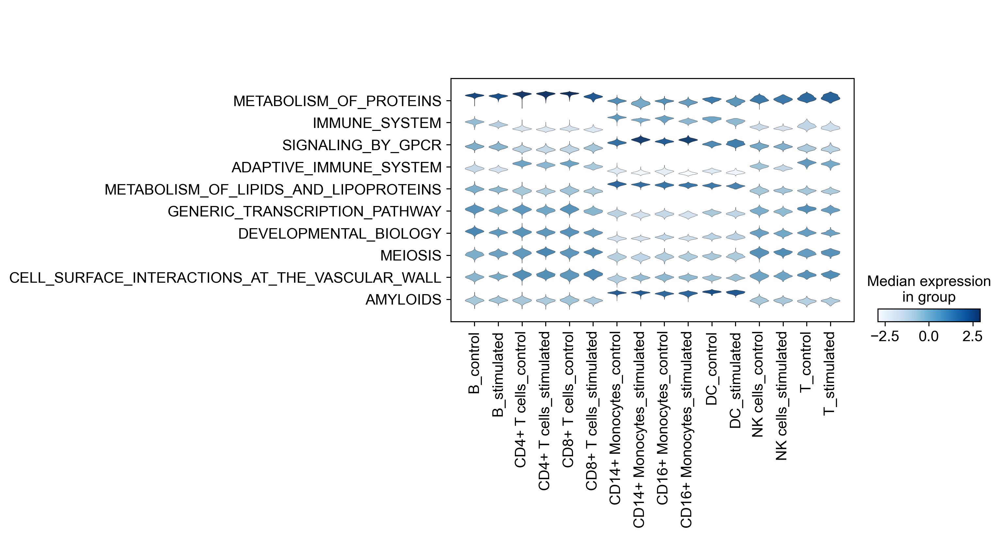

B


C:\Users\sergei.rybakov\Apps\Miniconda3\envs\work38\lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'ct_cond' as categorical


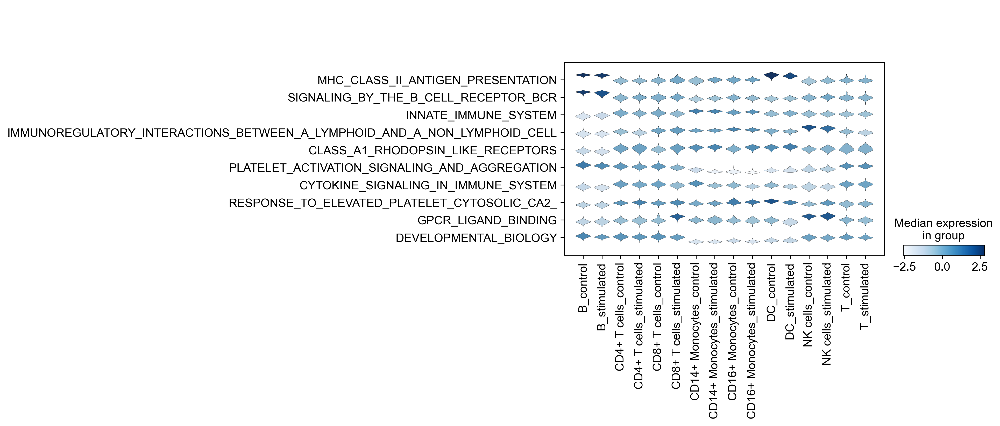

DC


C:\Users\sergei.rybakov\Apps\Miniconda3\envs\work38\lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'ct_cond' as categorical


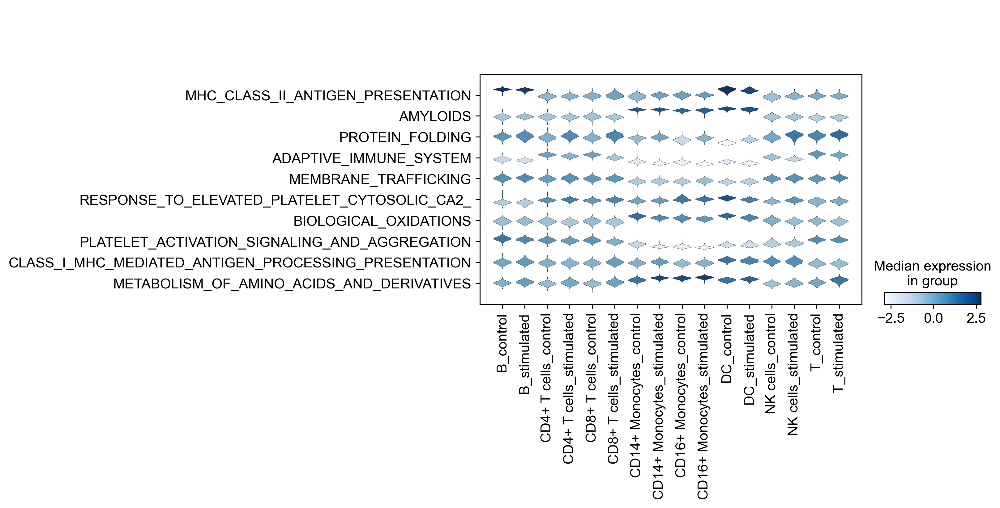

CD16+ Monocytes


C:\Users\sergei.rybakov\Apps\Miniconda3\envs\work38\lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'ct_cond' as categorical


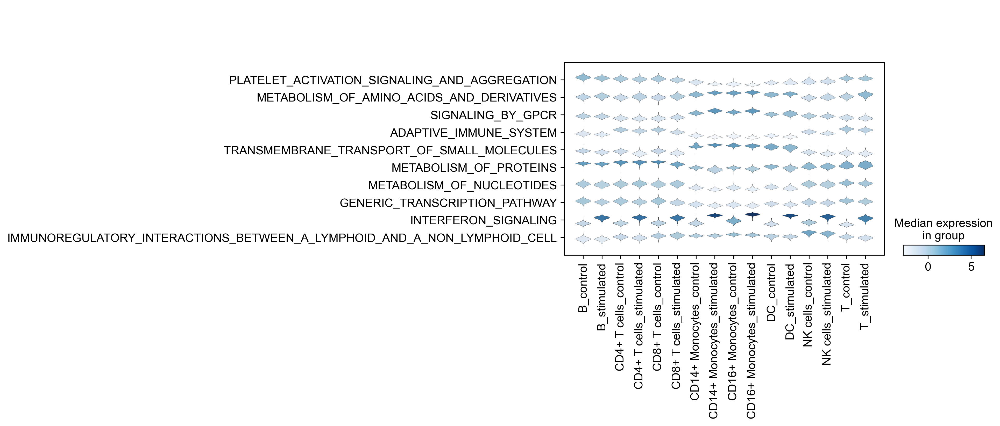

NK cells


C:\Users\sergei.rybakov\Apps\Miniconda3\envs\work38\lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'ct_cond' as categorical


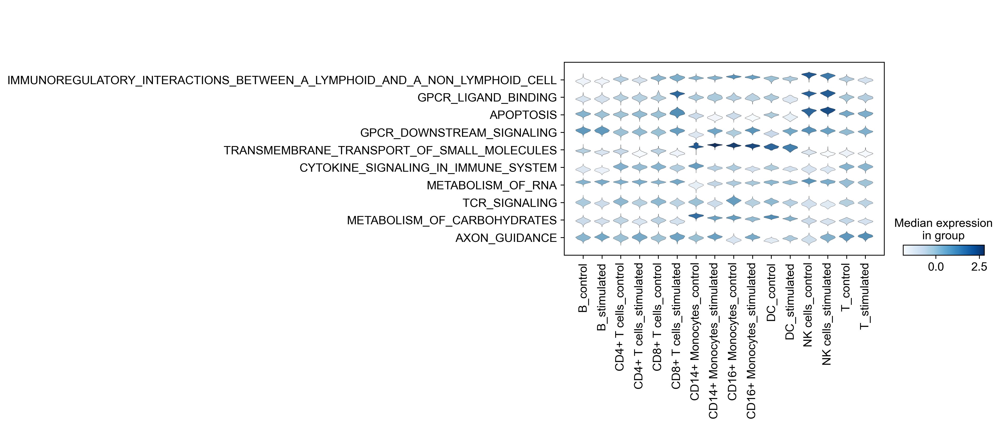

In [29]:
for ct in query_ct:
    print(ct)
    scores = scores_ct[ct]['bf']
    sort = np.argsort(np.abs(scores))[::-1]
    top_10_terms = adata.uns['full_terms'][sort][:10]
    idxs = [adata.uns['active_terms'].tolist().index(t) for t in top_10_terms]
    
    adata_pl = sc.AnnData(X=adata.obsm['X_cvae'][:, idxs])
    adata_pl.var_names = top_10_terms.tolist()
    adata_pl.obs['ct_cond'] = 'stub'
    for i in range(adata.n_obs):
        adata_pl.obs['ct_cond'][i] = adata.obs['cell_type_joint'][i] + '_' + adata.obs['condition_merged'][i]
    query_typs = adata_pl[adata.obs.study == 'Kang'].obs.ct_cond.unique().tolist()
    adata_pl_q = adata_pl[adata_pl.obs.ct_cond.isin(query_typs)]
    sc.pl.stacked_violin(adata_pl_q, var_names=top_10_terms, groupby='ct_cond', swap_axes=True)

CD14+ Monocytes


Trying to set attribute `.obs` of view, copying.
... storing 'ct_cond' as categorical


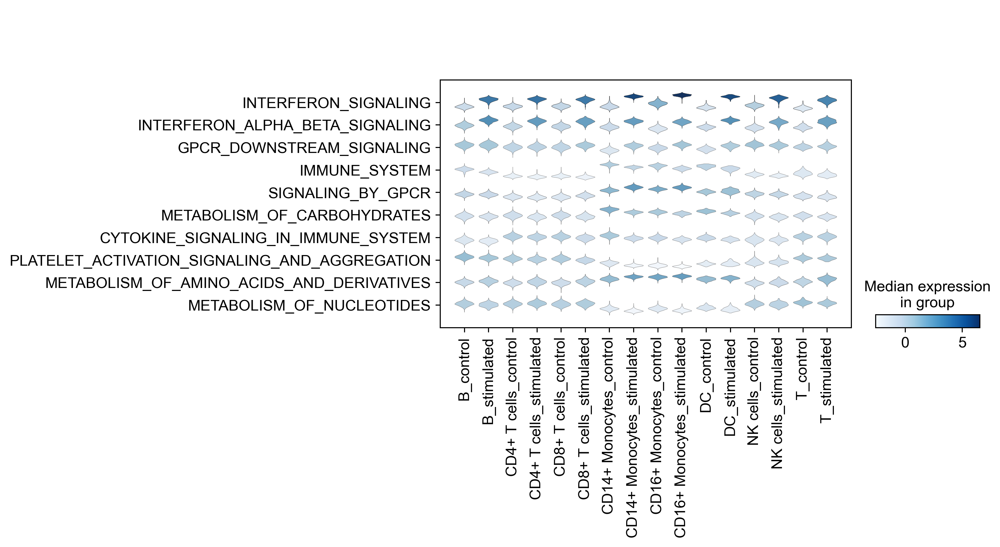

CD4+ T cells


C:\Users\sergei.rybakov\Apps\Miniconda3\envs\work38\lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'ct_cond' as categorical


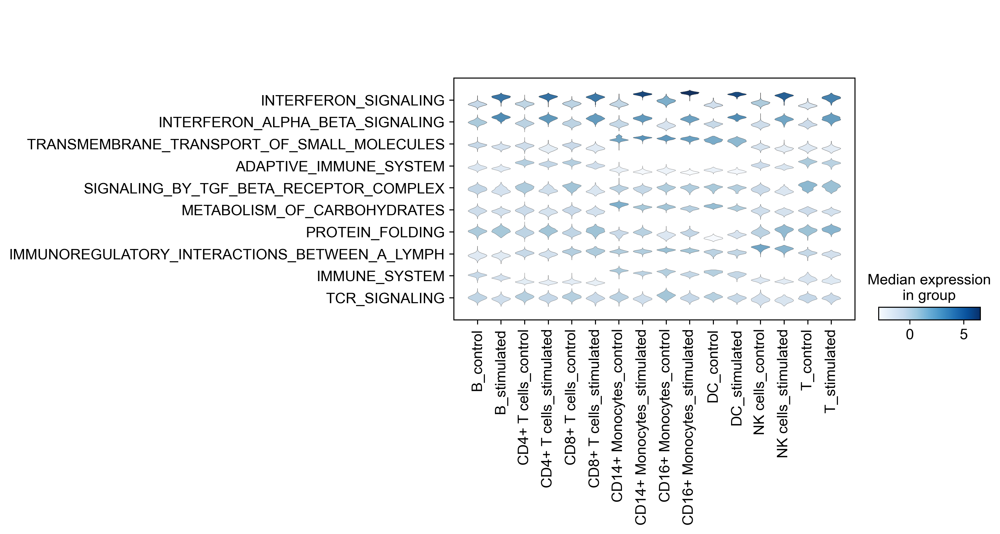

T


C:\Users\sergei.rybakov\Apps\Miniconda3\envs\work38\lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'ct_cond' as categorical


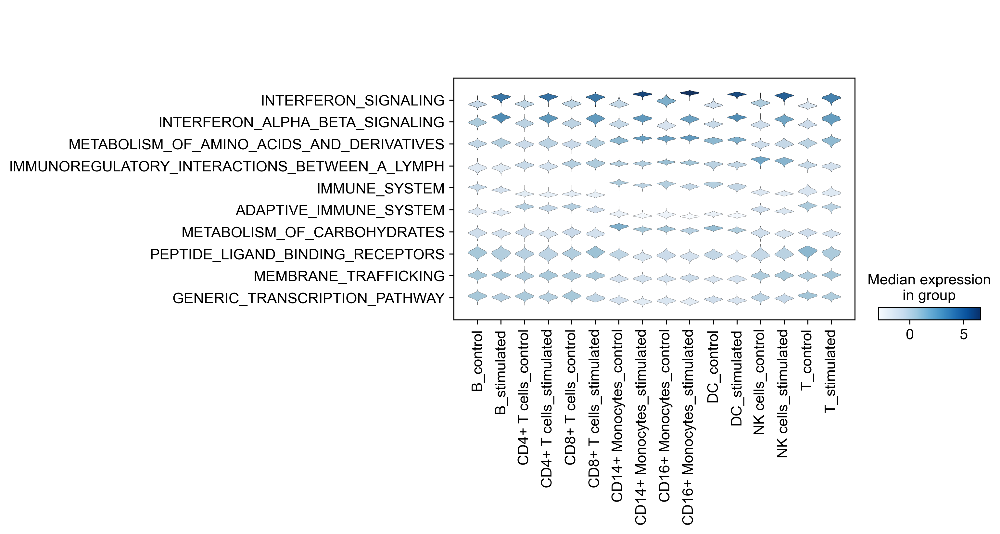

CD8+ T cells


C:\Users\sergei.rybakov\Apps\Miniconda3\envs\work38\lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'ct_cond' as categorical


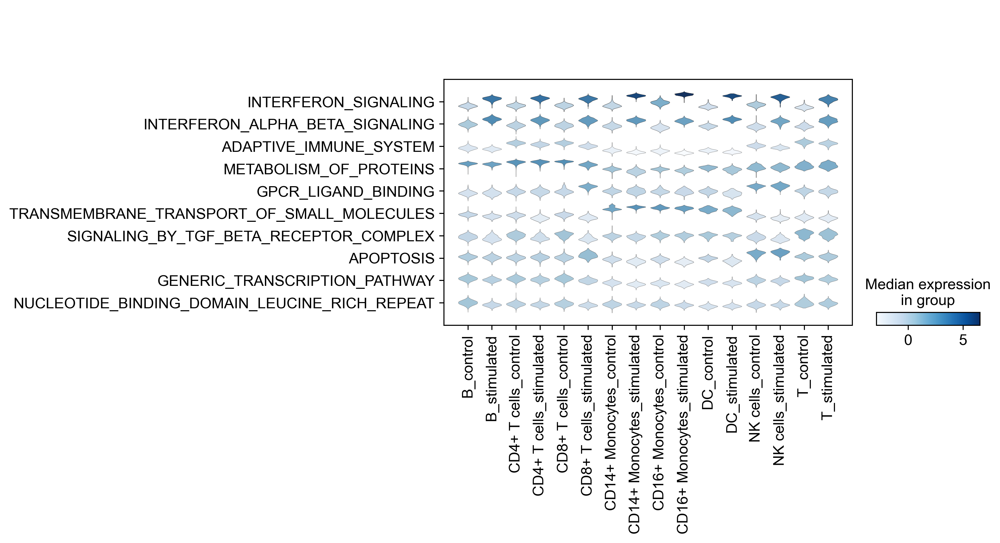

B


C:\Users\sergei.rybakov\Apps\Miniconda3\envs\work38\lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'ct_cond' as categorical


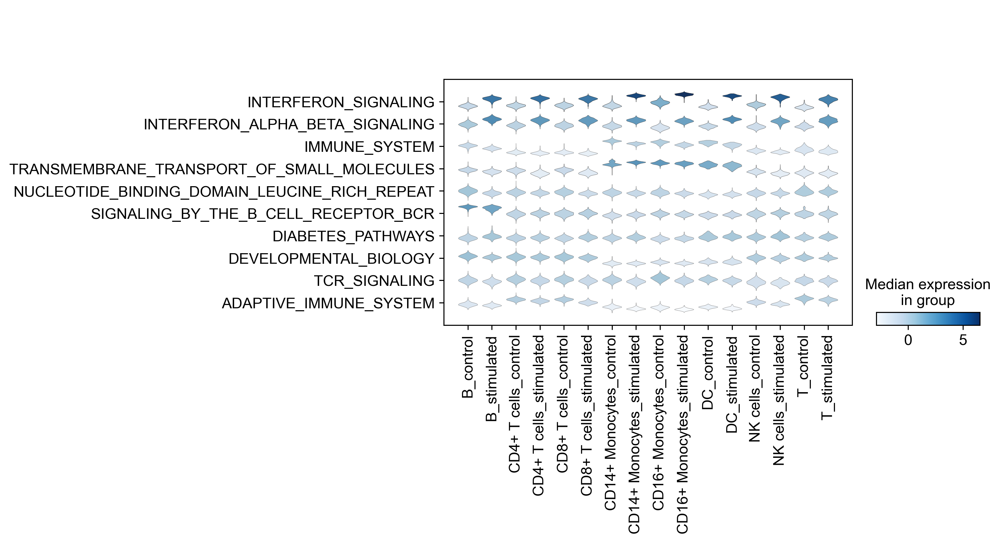

DC


C:\Users\sergei.rybakov\Apps\Miniconda3\envs\work38\lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'ct_cond' as categorical


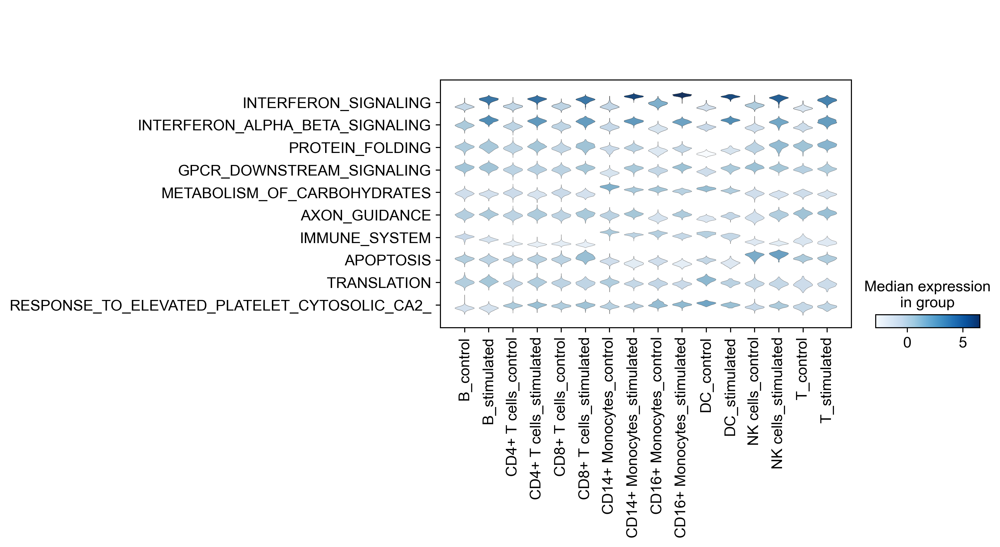

CD16+ Monocytes


C:\Users\sergei.rybakov\Apps\Miniconda3\envs\work38\lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'ct_cond' as categorical


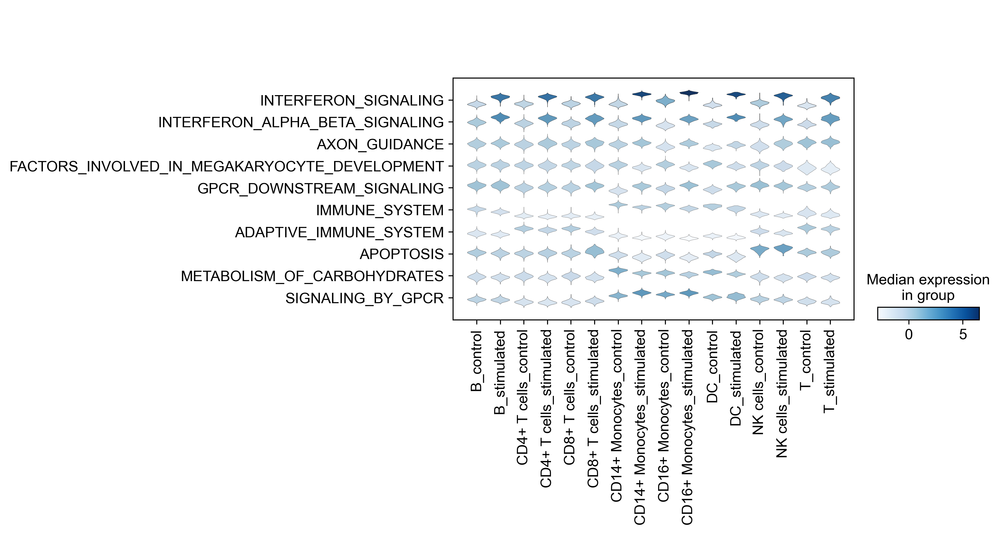

NK cells


C:\Users\sergei.rybakov\Apps\Miniconda3\envs\work38\lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'ct_cond' as categorical


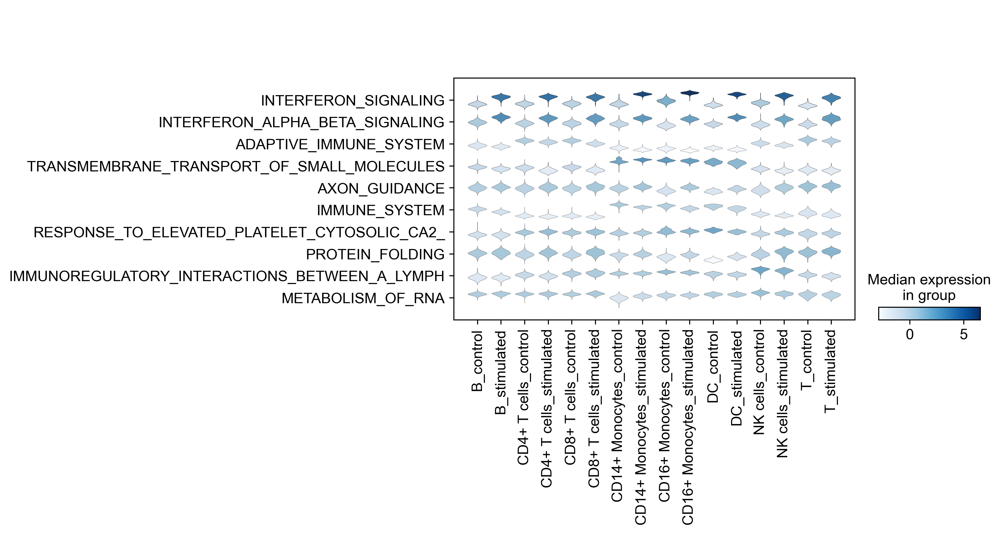

In [34]:
for ct in query_ct:
    print(ct)
    adata_ct = adata[adata.obs.cell_type_joint == ct]
    scores_c_ct = intr_cvae.latent_enrich('condition_merged', comparison="control", directions=directions, adata=adata_ct, n_perm=10000)
    
    scores = scores_c_ct['stimulated']['bf']
    sort = np.argsort(np.abs(scores))[::-1]
    top_10_terms = adata.uns['full_terms'][sort][:10]
    idxs = [adata.uns['active_terms'].tolist().index(t) for t in top_10_terms]
    
    adata_pl = sc.AnnData(X=adata.obsm['X_cvae'][:, idxs])
    terms = [t[:45] for t in top_10_terms]
    adata_pl.var_names = terms
    adata_pl.obs['ct_cond'] = 'stub'
    for i in range(adata.n_obs):
        adata_pl.obs['ct_cond'][i] = adata.obs['cell_type_joint'][i] + '_' + adata.obs['condition_merged'][i]
    query_typs = adata_pl[adata.obs.study == 'Kang'].obs.ct_cond.unique().tolist()
    adata_pl_q = adata_pl[adata_pl.obs.ct_cond.isin(query_typs)]
    sc.pl.stacked_violin(adata_pl_q, var_names=terms, groupby='ct_cond', swap_axes=True)